In [1]:
import json
import matplotlib.pyplot as plt

with open("moves.json", "r") as file:
    data = json.load(file)

unique_data = {}

for key, value in data.items():
    original_list = value
    unique_list = [original_list[0]]

    for num in original_list[1:]:
        if num != unique_list[-1]:
            unique_list.append(num)

    # Removing elements between repeated numbers
    final_list = [unique_list[0]]
    for i in range(1, len(unique_list) - 1):
        if unique_list[i] not in unique_list[i + 1:]:
            final_list.append(unique_list[i])
    final_list.append(unique_list[-1])

    unique_data[key] = final_list

data = unique_data
print(data)
print(len(data))

{'h728c1:0_0': ['-43', '-27', '-3', '11', '23', '31'], 'h3270c1:0_0': ['-31', '-23', '-11', '3', '27', '45'], 'h854c1:0_0': ['-15', '11', '23'], 'h2295c1:0_0': ['-152', '144', '-15', '3', '-71', '202', '334', '-334'], 'h1148c1:0_0': ['-144', '152', '-162', '120'], 'h134c1:0_0': ['219', '75', '-64'], 'h479c1:0_0': ['-60', '-31', '-23', '-11', '3', '-71', '202'], 'h307c1:0_0': ['92', '-190', '-172', '164', '-152', '148'], 'h2394c1:0_0': ['27', '55', '71', '-3', '15', '-144', '152', '-164'], 'h786c1:0_0': ['58', '-23'], 'h1815c1:0_0': ['334', '-334', '-202', '71', '-3', '15', '-144', '152', '-162'], 'h1451c1:0_0': ['-334', '-202', '71', '-3', '11', '109'], 'h798c1:0_0': ['-23', '-11', '3', '27', '43', '199'], 'h265c1:0_0': ['190', '219', '79', '-79', '92'], 'h1600c1:0_0': ['162', '-152', '-131', '-109', '23'], 'h2671c1:0_0': ['-199', '-43', '-27', '-3', '11', '109', '123'], 'h1010c1:0_0': ['-148', '152', '-162', '120'], 'h798c1:0_1': ['199', '-202', '71', '-3', '11', '23', '37', '-31', '-

In [2]:
# Create a new dictionary to store the filtered and expanded data
filtered_data = {}

# Iterate over each key-value pair in the dictionary
for key, value_list in data.items():
    if len(value_list) >= 6:
        # Create sliding windows of length 6
        for i in range(len(value_list) - 5):
            new_key = f"{key}_{i}"  # Adjust the key to include index
            new_value = value_list[i:i+6]
            filtered_data[new_key] = new_value
    else:
        # Remove entries with length less than 6
        pass

data = filtered_data
original_data = data.copy()
print(data)
print(len(data))

{'h728c1:0_0_0': ['-43', '-27', '-3', '11', '23', '31'], 'h3270c1:0_0_0': ['-31', '-23', '-11', '3', '27', '45'], 'h2295c1:0_0_0': ['-152', '144', '-15', '3', '-71', '202'], 'h2295c1:0_0_1': ['144', '-15', '3', '-71', '202', '334'], 'h2295c1:0_0_2': ['-15', '3', '-71', '202', '334', '-334'], 'h479c1:0_0_0': ['-60', '-31', '-23', '-11', '3', '-71'], 'h479c1:0_0_1': ['-31', '-23', '-11', '3', '-71', '202'], 'h307c1:0_0_0': ['92', '-190', '-172', '164', '-152', '148'], 'h2394c1:0_0_0': ['27', '55', '71', '-3', '15', '-144'], 'h2394c1:0_0_1': ['55', '71', '-3', '15', '-144', '152'], 'h2394c1:0_0_2': ['71', '-3', '15', '-144', '152', '-164'], 'h1815c1:0_0_0': ['334', '-334', '-202', '71', '-3', '15'], 'h1815c1:0_0_1': ['-334', '-202', '71', '-3', '15', '-144'], 'h1815c1:0_0_2': ['-202', '71', '-3', '15', '-144', '152'], 'h1815c1:0_0_3': ['71', '-3', '15', '-144', '152', '-162'], 'h1451c1:0_0_0': ['-334', '-202', '71', '-3', '11', '109'], 'h798c1:0_0_0': ['-23', '-11', '3', '27', '43', '199'

In [3]:
unique_numbers = set()

for value_list in data.values():
    for item in value_list:
        unique_numbers.add(int(item))

unique_numbers = list(unique_numbers)
print(unique_numbers)

[3, 131, -123, 5, -120, 11, 15, 144, -109, 148, 23, 152, 27, -229, 31, 162, 164, 37, 43, 172, 45, -338, -79, -334, -206, -75, -202, 55, 184, -71, -199, 58, 60, -196, 190, 64, -64, -190, -60, 68, 196, 71, 199, -184, 202, 75, -55, 334, 79, 338, -172, -43, 219, 92, -164, -162, -31, -27, 229, -152, -23, -148, 109, -131, -144, -15, -11, 120, 123, -3]


In [4]:
import numpy as np
# Initialize a dictionary to store updated values
updated_data = {}

# Iterate through unique_data
for key, value_list in data.items():
    # Create a list to store the numerical representation of numbers in the original list
    numerical_list = [0] * len(unique_numbers)
    
    # Iterate through each number in the value list
    for item in value_list:
        # Check if the number is in unique_numbers_list
        if int(item) in unique_numbers:
            # If it is, get its index in unique_numbers_list
            index = unique_numbers.index(int(item))
            # Increment the value by 1 and update the corresponding index in numerical_list
            numerical_list[index] = value_list.index(item) + 1
    
    # Update the value in updated_data
    updated_data[key] = numerical_list

# Print updated_data
print(unique_numbers)
data = updated_data
for key, value in data.items():
    print(key, ":", value)

[3, 131, -123, 5, -120, 11, 15, 144, -109, 148, 23, 152, 27, -229, 31, 162, 164, 37, 43, 172, 45, -338, -79, -334, -206, -75, -202, 55, 184, -71, -199, 58, 60, -196, 190, 64, -64, -190, -60, 68, 196, 71, 199, -184, 202, 75, -55, 334, 79, 338, -172, -43, 219, 92, -164, -162, -31, -27, 229, -152, -23, -148, 109, -131, -144, -15, -11, 120, 123, -3]
h728c1:0_0_0 : [0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 5, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3]
h3270c1:0_0_0 : [4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0]
h2295c1:0_0_0 : [4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,

In [5]:
def replace_row_with_zeros(matrix, row_index, keep_value):
    if row_index < 0 or row_index >= len(matrix):
        print("Invalid row index")
        return

    row = matrix[row_index]
    for i in range(len(row)):
        if row[i] != keep_value:
            row[i] = 0

def replace_non_zeros_with_one(matrix):
    for row_index, row in enumerate(matrix):
        for col_index, value in enumerate(row):
            if value != 0:
                matrix[row_index][col_index] = 1

In [6]:
for key, value in data.items():
    new_value=[]
    for i in range(0,6):
        new_value.append(value.copy())
    for i in range(0,6):
        replace_row_with_zeros(new_value, i, i+1)
    replace_non_zeros_with_one(new_value)
    data[key] = new_value
    print(key, ":", data[key])

h728c1:0_0_0 : [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [7]:
import torch
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid

c:\Users\Matyiko\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: 'Could not find module 'C:\Users\Matyiko\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [8]:
batch_size = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

def split_list_by_percentage(my_list, percentage):
    # Calculate the split index based on the percentage
    split_index = int(len(my_list) * percentage / 100)
    
    # Split the list into two parts
    first_half = my_list[:split_index]
    second_half = my_list[split_index:]
    
    return first_half, second_half


percentage = 40  # Split into 40% and 60%
first_half, original_data = split_list_by_percentage(original_data, 80)

print("First half:", first_half)
print("Second half:", original_data)

# NEW VESION
from sklearn.model_selection import train_test_split
# create a transofrm to apply to each datapoint
data_tensor = torch.tensor([value for value in data.values()], dtype=torch.float32)

train, test = train_test_split(data_tensor, test_size=0.2, random_state=None)



#train_dataset = data_tensor
train_dataset = train.unsqueeze(1)
test_dataset = test.unsqueeze(1)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

# create train and test dataloaders

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

data_dim=420

In [9]:
# OLD VERSION
# create a transofrm to apply to each datapoint
data_tensor = torch.tensor([value for value in data.values()], dtype=torch.float32)

#train_dataset = data_tensor
train_dataset = data_tensor.unsqueeze(1)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

# create train and test dataloaders

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=False)

data_dim=420

In [10]:
# create a transofrm to apply to each datapoint
transform = transforms.Compose([transforms.ToTensor()])

# download the MNIST datasets
path = '~/datasets'
train_dataset_MNIST = MNIST(path, transform=transform, download=True)
#test_dataset  = MNIST(path, transform=transform, download=True)

# create train and test dataloaders
train_loader_MNIST = DataLoader(dataset=train_dataset_MNIST, batch_size=batch_size, shuffle=True)
#test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

#data_dim = 784

# get 25 sample training images for visualization
dataiter = iter(train_loader_MNIST)
image = next(dataiter)

num_samples = 25
sample_images = [image[0][i,0] for i in range(num_samples)] 

fig = plt.figure(figsize=(5, 5))
grid = ImageGrid(fig, 111, nrows_ncols=(5, 5), axes_pad=0.1)

for ax, im in zip(grid, sample_images):
    ax.imshow(im, cmap='gray')
    ax.axis('off')

plt.show()

In [11]:
class Encoder(nn.Module):
    
    def __init__(self, input_dim=data_dim, hidden_dim=512, latent_dim=256):
        super(Encoder, self).__init__()

        self.linear1 = nn.Linear(input_dim, hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.mean = nn.Linear(hidden_dim, latent_dim)
        self.var = nn.Linear (hidden_dim, latent_dim)
        self.LeakyReLU = nn.LeakyReLU(0.2)
        self.training = True
        
    def forward(self, x):
        x = self.LeakyReLU(self.linear1(x))
        x = self.LeakyReLU(self.linear2(x))

        mean = self.mean(x)
        log_var = self.var(x)                     
        return mean, log_var

In [12]:
class Decoder(nn.Module):
    
    def __init__(self, output_dim=data_dim, hidden_dim=512, latent_dim=256):
        super(Decoder, self).__init__()

        self.linear2 = nn.Linear(latent_dim, hidden_dim)
        self.linear1 = nn.Linear(hidden_dim, hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        x = self.LeakyReLU(self.linear2(x))
        x = self.LeakyReLU(self.linear1(x))
        
        x_hat = torch.sigmoid(self.output(x))
        return x_hat

In [13]:
class VAE(nn.Module):

    def __init__(self, input_dim=data_dim, hidden_dim=400, latent_dim=200, device=device):
        super(VAE, self).__init__()
        
        self.device = device #newly added

        # encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim),
            nn.LeakyReLU(0.2)
            )
        
        # latent mean and variance 
        self.mean_layer = nn.Linear(latent_dim, 2)
        self.logvar_layer = nn.Linear(latent_dim, 2)
        
        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(2, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            )
     
    def encode(self, x):
        x = self.encoder(x)
        mean, logvar = self.mean_layer(x), self.logvar_layer(x)
        return mean, logvar

    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)      
        z = mean + var*epsilon
        return z

    def decode(self, x):
        return self.decoder(x)
        
    def forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var)) 
        x_hat = self.decode(z)  
        return x_hat, mean, log_var

In [14]:
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [15]:
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

In [16]:
def train(model, optimizer, epochs, device, x_dim=data_dim):
    model.train()
    for epoch in range(epochs):
        overall_loss = 0
        for batch_idx, (x) in enumerate(train_loader):
            x = x.view(batch_size, x_dim).to(device)

            optimizer.zero_grad()

            x_hat, mean, log_var = model(x)
            loss = loss_function(x, x_hat, mean, log_var)
            
            overall_loss += loss.item()
            
            loss.backward()
            optimizer.step()

        print("\tEpoch", epoch + 1, "\tAverage Loss: ", overall_loss/(batch_idx*batch_size))
    return overall_loss

In [17]:
train(model, optimizer, epochs=30, device=device)

	Epoch 1 	Average Loss:  26.861714095161076
	Epoch 2 	Average Loss:  17.829676713262284
	Epoch 3 	Average Loss:  15.904410819780258
	Epoch 4 	Average Loss:  14.878094418843586
	Epoch 5 	Average Loss:  14.129166456631252
	Epoch 6 	Average Loss:  13.617486535935175
	Epoch 7 	Average Loss:  13.270722433498927
	Epoch 8 	Average Loss:  12.880188482148307
	Epoch 9 	Average Loss:  12.633124510447184
	Epoch 10 	Average Loss:  12.368632255281721
	Epoch 11 	Average Loss:  12.198537597202119
	Epoch 12 	Average Loss:  12.036447918982732
	Epoch 13 	Average Loss:  11.828501146180288
	Epoch 14 	Average Loss:  11.792722535133361
	Epoch 15 	Average Loss:  11.651690685181391
	Epoch 16 	Average Loss:  11.49739768959227
	Epoch 17 	Average Loss:  11.413730090005057
	Epoch 18 	Average Loss:  11.399313221658979
	Epoch 19 	Average Loss:  11.291495076815288
	Epoch 20 	Average Loss:  11.24836654322488
	Epoch 21 	Average Loss:  11.122758349918184
	Epoch 22 	Average Loss:  11.10323975767408
	Epoch 23 	Average Los

71292.73231506348

In [18]:
def generate_digit(input, roads_to_test):
    input = input.view(batch_size, 420).to(device)
    with torch.no_grad():
        digit, _, _ = model(input)
    digit = digit.view(batch_size, 6, 70)
    digit = digit.tolist()
    
    i = 0
    for _, value in data.items():
        roads_to_test.append(digit[i])
        #print(digit[i])
        #print("----- ", i, " -----")
        #plt.imshow(value, cmap='gray')
        #plt.axis('off')
        #plt.show()
        #plt.imshow(digit[i], cmap='gray')
        #plt.axis('off')
        #plt.show()
        i += 1
        if i == batch_size:
            break
    

In [19]:
counter = 0
roads_to_test = []
for batch_idx, x in enumerate(train_loader):
    generate_digit(x, roads_to_test)
    #counter += 1
    #if counter == 2:
        #break

counter = 0
for key, value in data.items():
    plt.imshow(value, cmap='gray')
    plt.axis('off')
    plt.show()
    counter += 1
    if counter == 10:
        break

# Initialize counters for correct and incorrect positions
total_correct = 0
total_incorrect = 0

for batch_idx, (x) in enumerate(train_loader):
    y=x
    x = x.view(batch_size, 420).to(device)
    with torch.no_grad():
        x_hat, mean, log_var = model(x)
    
    # Find the index of the maximum value in each 70-long list
    max_indices = torch.argmax(x_hat, dim=1)
    
    # Create a binary tensor where only the maximum value is set to 1
    binary_output = torch.zeros_like(x_hat)
    binary_output[torch.arange(batch_size), max_indices] = 1
    
    
    # Reshape binary_output back to [batch_size, 6, 70]
    binary_output = binary_output.view(batch_size, 6, 70)
    
    # Find positions where both input and binary output have 1
    correct_positions = torch.logical_and(torch.eq(y, 1), torch.eq(binary_output, 1))
    
    # Count correct positions
    correct_count = torch.sum(correct_positions).item()
    
    total_correct += correct_count
    
    # Find positions where input has 1 and binary output has 0
    incorrect_positions = torch.logical_and(torch.eq(y, 1), torch.eq(binary_output, 0))
    
    # Count incorrect positions
    incorrect_count = torch.sum(incorrect_positions).item()
    
    total_incorrect += incorrect_count
    
print("Total correct positions:", total_correct)
print("Total incorrect positions:", total_incorrect)

print(f"Accuracy: {total_correct / (total_correct + total_incorrect) * 100:.2f}%")

In [20]:
import sumolib

# Parse the network
net = sumolib.net.readNet("rand_grid.net.xml")

edges = net.getEdges()

print(edges)

[<edge id="-109" from="108" to="10"/>, <edge id="-11" from="10" to="1"/>, <edge id="-120" from="108" to="63"/>, <edge id="-123" from="14" to="108"/>, <edge id="-131" from="130" to="108"/>, <edge id="-144" from="14" to="130"/>, <edge id="-148" from="147" to="130"/>, <edge id="-15" from="14" to="1"/>, <edge id="-152" from="151" to="130"/>, <edge id="-162" from="151" to="63"/>, <edge id="-164" from="151" to="147"/>, <edge id="-172" from="171" to="147"/>, <edge id="-184" from="183" to="171"/>, <edge id="-190" from="189" to="171"/>, <edge id="-196" from="195" to="171"/>, <edge id="-199" from="198" to="42"/>, <edge id="-202" from="198" to="54"/>, <edge id="-206" from="205" to="1"/>, <edge id="-229" from="228" to="189"/>, <edge id="-23" from="22" to="10"/>, <edge id="-27" from="26" to="2"/>, <edge id="-3" from="2" to="1"/>, <edge id="-31" from="30" to="22"/>, <edge id="-334" from="333" to="198"/>, <edge id="-338" from="337" to="198"/>, <edge id="-43" from="42" to="26"/>, <edge id="-55" from="

In [21]:
print(unique_numbers)

[3, 131, -123, 5, -120, 11, 15, 144, -109, 148, 23, 152, 27, -229, 31, 162, 164, 37, 43, 172, 45, -338, -79, -334, -206, -75, -202, 55, 184, -71, -199, 58, 60, -196, 190, 64, -64, -190, -60, 68, 196, 71, 199, -184, 202, 75, -55, 334, 79, 338, -172, -43, 219, 92, -164, -162, -31, -27, 229, -152, -23, -148, 109, -131, -144, -15, -11, 120, 123, -3]


In [22]:
result_values = []
for road in roads_to_test:
    max_indexes = ([sublist.index(max(sublist)) for sublist in road])
    result_values.append([unique_numbers[index] for index in max_indexes])

print("The maximum values from each sublist are:", max_indexes)
print("The values corresponding to the maximum indexes are:", result_values)

The maximum values from each sublist are: [69, 5, 10, 14, 32, 53]
The values corresponding to the maximum indexes are: [[-55, -27, -3, 11, 23, 31], [-31, -23, -11, 3, 27, 43], [-148, 144, -15, 3, -71, 202], [-23, -11, 3, -71, 202, 334], [-11, 3, -71, 202, 334, -334], [-64, -31, -23, -11, 3, -71], [-31, -23, -11, 3, -71, 202], [196, -190, -172, 164, -162, -64], [199, -202, 71, -3, 15, -144], [-202, 71, -3, 15, -144, -131], [-27, -3, 15, -144, 148, 172], [334, -334, 60, 75, -3, 11], [-334, -202, 71, -3, 15, -144], [-202, 71, -3, 15, -144, -131], [-27, -3, 15, -144, 148, 172], [-334, -202, 71, -3, 15, -144], [-23, -11, 3, 27, 43, 199], [-199, -43, -27, -3, 11, 23], [-43, -27, -3, 11, 109, -120], [199, -202, 71, -3, 15, -144], [-202, 71, -3, 11, 23, 31], [-27, -3, 11, 109, -120, -31], [-3, 11, 23, 37, -31, -23], [23, 31, 64, 162, -164, -15], [172, 31, -131, -172, 23, 144], [196, -196, -172, 164, -162, -75], [-190, -172, -148, -131, -109, -11], [-15, 11, 23, 31, 60, 92], [-31, -23, 109, 131

In [23]:
#max_indexes = ([sublist.index(max(sublist)) for sublist in roads_to_test[11]])
#result_values = [unique_numbers[index] for index in max_indexes]

#print("The maximum values from each sublist are:", max_indexes)
#print("The values corresponding to the maximum indexes are:", result_values)

In [24]:
edge1 = net.getEdge('-196')
edge2 = net.getEdge('11')
print(edge1)
print(edge2)

<edge id="-196" from="195" to="171"/>
<edge id="11" from="1" to="10"/>


In [25]:
net.getOptimalPath(edge1, edge2)

((<edge id="-196" from="195" to="171"/>,
  <edge id="-172" from="171" to="147"/>,
  <edge id="-148" from="147" to="130"/>,
  <edge id="144" from="130" to="14"/>,
  <edge id="-15" from="14" to="1"/>,
  <edge id="11" from="1" to="10"/>),
 750.51)

In [26]:
edge = net.getEdge('-3')
print(edge)

<edge id="-3" from="2" to="1"/>


In [27]:
out_going = net.getEdge('-162').getOutgoing()
out_going

{<edge id="-75" from="63" to="59"/>: [<sumolib.net.connection.Connection at 0x1d8d905b350>],
 <edge id="-64" from="63" to="30"/>: [<sumolib.net.connection.Connection at 0x1d8d905b490>],
 <edge id="120" from="63" to="108"/>: [<sumolib.net.connection.Connection at 0x1d8d905b5d0>]}

In [28]:
asd = []
for key, value in out_going.items():
    print(key, ":", value)
    asd.append(key)

<edge id="-75" from="63" to="59"/> : [<sumolib.net.connection.Connection object at 0x000001D8D905B350>]
<edge id="-64" from="63" to="30"/> : [<sumolib.net.connection.Connection object at 0x000001D8D905B490>]
<edge id="120" from="63" to="108"/> : [<sumolib.net.connection.Connection object at 0x000001D8D905B5D0>]


In [29]:
asd[0].getID()

'-75'

In [30]:
print(result_values)

[[-55, -27, -3, 11, 23, 31], [-31, -23, -11, 3, 27, 43], [-148, 144, -15, 3, -71, 202], [-23, -11, 3, -71, 202, 334], [-11, 3, -71, 202, 334, -334], [-64, -31, -23, -11, 3, -71], [-31, -23, -11, 3, -71, 202], [196, -190, -172, 164, -162, -64], [199, -202, 71, -3, 15, -144], [-202, 71, -3, 15, -144, -131], [-27, -3, 15, -144, 148, 172], [334, -334, 60, 75, -3, 11], [-334, -202, 71, -3, 15, -144], [-202, 71, -3, 15, -144, -131], [-27, -3, 15, -144, 148, 172], [-334, -202, 71, -3, 15, -144], [-23, -11, 3, 27, 43, 199], [-199, -43, -27, -3, 11, 23], [-43, -27, -3, 11, 109, -120], [199, -202, 71, -3, 15, -144], [-202, 71, -3, 11, 23, 31], [-27, -3, 11, 109, -120, -31], [-3, 11, 23, 37, -31, -23], [23, 31, 64, 162, -164, -15], [172, 31, -131, -172, 23, 144], [196, -196, -172, 164, -162, -75], [-190, -172, -148, -131, -109, -11], [-15, 11, 23, 31, 60, 92], [-31, -23, 109, 131, 148, 172], [202, -199, -43, -27, -3, 11], [60, 60, 92, 229, -229, -11], [-190, -172, -148, 144, -123, 3], [-172, -148

In [31]:
original_values = []
i = 0
for key, value in original_data.items():
    print("---", i, "---")
    print(value)
    original_values.append([int(item) for item in value if item.strip()])
    print(result_values[i])
    i += 1

--- 0 ---
['-43', '-27', '-3', '11', '23', '31']
[-55, -27, -3, 11, 23, 31]
--- 1 ---
['-31', '-23', '-11', '3', '27', '45']
[-31, -23, -11, 3, 27, 43]
--- 2 ---
['-152', '144', '-15', '3', '-71', '202']
[-148, 144, -15, 3, -71, 202]
--- 3 ---
['144', '-15', '3', '-71', '202', '334']
[-23, -11, 3, -71, 202, 334]
--- 4 ---
['-15', '3', '-71', '202', '334', '-334']
[-11, 3, -71, 202, 334, -334]
--- 5 ---
['-60', '-31', '-23', '-11', '3', '-71']
[-64, -31, -23, -11, 3, -71]
--- 6 ---
['-31', '-23', '-11', '3', '-71', '202']
[-31, -23, -11, 3, -71, 202]
--- 7 ---
['92', '-190', '-172', '164', '-152', '148']
[196, -190, -172, 164, -162, -64]
--- 8 ---
['27', '55', '71', '-3', '15', '-144']
[199, -202, 71, -3, 15, -144]
--- 9 ---
['55', '71', '-3', '15', '-144', '152']
[-202, 71, -3, 15, -144, -131]
--- 10 ---
['71', '-3', '15', '-144', '152', '-164']
[-27, -3, 15, -144, 148, 172]
--- 11 ---
['334', '-334', '-202', '71', '-3', '15']
[334, -334, 60, 75, -3, 11]
--- 12 ---
['-334', '-202', '71

In [32]:
def isRoadExist(last_edge, ghost_edge):
    out_going = net.getEdge(str(last_edge)).getOutgoing()
    #neighbors = []
    for key, _ in out_going.items():
        #print("key.getID(): ", key.getID(), "ghost_road: ", ghost_edge)
        if int(key.getID()) == ghost_edge:
            return True
    return False

Validity és Novelti újra

Megnézzük, hogy hány jó élünk van és összehasonlítjuk az eredeti adathalmazzal és a térképpel

In [118]:
keresztezodes_exists_count = 0
keresztezodes_doesnt_exist_count = 0
utca_exists_count = 0
utca_doesnt_exists_count = 0
elso_utcak_szama = 0
elozo_keresztezodes = None

jo_utca = []
jo_utcak_gyujtemenye = []


for utca in result_values:
    jo_utca = []
    for kresztezodes in utca:
        if elozo_keresztezodes is not None:
            last_different_value = elozo_keresztezodes
            if(isRoadExist(last_different_value, kresztezodes)):
                keresztezodes_exists_count += 1
                jo_utca.append(last_different_value)
            else:
                keresztezodes_doesnt_exist_count += 1
                flag = False
        else:
            last_different_value = kresztezodes
            flag = True
            elso_utcak_szama += 1
        elozo_keresztezodes = kresztezodes
    elozo_keresztezodes = None
    if flag:
        utca_exists_count += 1
        jo_utca.append(kresztezodes)
        jo_utcak_gyujtemenye.append(jo_utca)
    else:
        utca_doesnt_exists_count += 1
        

print("keresztezodes_exists_count: ", keresztezodes_exists_count)
print("keresztezodes_doesnt_exist_count: ", keresztezodes_doesnt_exist_count)
print(f"Accuracy: {keresztezodes_exists_count/(keresztezodes_exists_count+keresztezodes_doesnt_exist_count)}")
print("utca_exists_count: ", utca_exists_count)
print("utca_doesnt_exists_count: ", utca_doesnt_exists_count)
print(f"Accuracy: {utca_exists_count/(utca_exists_count+utca_doesnt_exists_count)}")
print("elso_utcak_szama: ", elso_utcak_szama)
print("jo_utcak_gyujtemenye", len(jo_utcak_gyujtemenye))

keresztezodes_exists_count:  31898
keresztezodes_doesnt_exist_count:  1752
Accuracy: 0.9479346210995543
utca_exists_count:  5400
utca_doesnt_exists_count:  1330
Accuracy: 0.8023774145616642
elso_utcak_szama:  6730
jo_utcak_gyujtemenye 5400


In [123]:
# Step 1: Convert inner lists to tuples
original_as_tuples = [tuple(lst) for lst in jo_utcak_gyujtemenye]

# Step 2: Use a set to keep only unique tuples
unique_tuples = set(original_as_tuples)

# Step 3: Convert tuples back to lists
unique_jo_utcak_gyujtemenye = [list(t) for t in unique_tuples]

print("Egyedi jó utcák száma: ", len(unique_jo_utcak_gyujtemenye))


# Step 1: Convert inner lists to tuples
original_as_tuples = [tuple(lst) for lst in result_values]

# Step 2: Use a set to keep only unique tuples
unique_tuples = set(original_as_tuples)

# Step 3: Convert tuples back to lists
unique_összes_utca_gyujtemenye = [list(t) for t in unique_tuples]

print("Egyedi összes utca száma: ", len(unique_összes_utca_gyujtemenye))

print(f"Accuracy: {len(unique_jo_utcak_gyujtemenye)/len(unique_összes_utca_gyujtemenye)}")

Egyedi jó utcák száma:  151
Egyedi összes utca száma:  525
Accuracy: 0.2876190476190476


In [107]:

# Step 1: Convert inner lists to tuples
original_as_tuples = [tuple(lst) for lst in original_values]

# Step 2: Use a set to keep only unique tuples
unique_tuples = set(original_as_tuples)

# Step 3: Convert tuples back to lists
unique_original_values = [list(t) for t in unique_tuples]

print("Egyedi utcák száma: ", len(unique_original_values))

Egyedi utcák száma:  615


In [117]:
list1 = unique_jo_utcak_gyujtemenye
list2 = unique_original_values

# Find common items
common_items = [item for item in list1 if item in list2]

# Find items unique to each list
unique_in_list1 = [item for item in list1 if item not in list2]
unique_in_list2 = [item for item in list2 if item not in list1]

# Count results
common_count = len(common_items)
unique_count = len(unique_in_list1) + len(unique_in_list2)

print(f"Count: {common_count}")
print(f"Unique items: {unique_count}")

# Find items in list1 but not in list2
unique_in_list1 = [item for item in list1 if item not in list2]

# Count the number of unique items
unique_count = len(unique_in_list1)

print(f"Azon utak száma, ami rajta van a térképen, de nincs a tanító adathalmazban:\n{unique_count}")
print(f"Azon utak, amik rajta vannak a térképen, de nincsenek a tanító adathalmazban:\n{unique_in_list1}")

Count: 146
Unique items: 474
Azon utak száma, ami rajta van a térképen, de nincs a tanító adathalmazban:
5
Azon utak, amik rajta vannak a térképen, de nincsenek a tanító adathalmazban:
[[-27, -3, 11, 23, 37, 60], [-23, -11, 3, 27, 45, 199], [43, 68, -27, -3, 5, -206], [-199, 68, -27, -3, 11, 23], [-148, -131, -109, 23, 31, 60]]


Number of unique lists: 525
Total number of lists: 6730


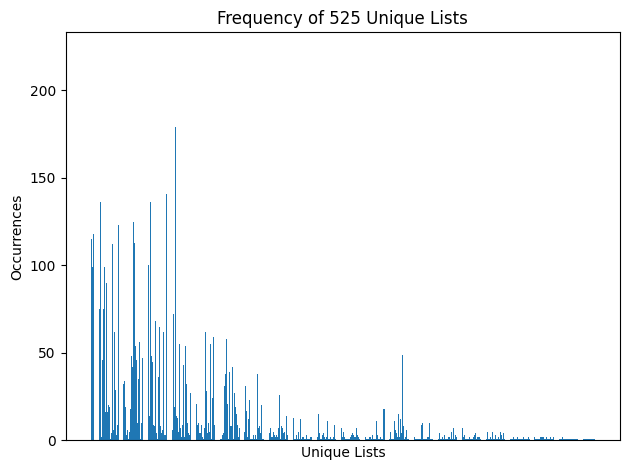

In [66]:
from collections import Counter
import matplotlib.pyplot as plt

# Your list of lists (complex elements)
list_of_lists = result_values

# Convert each list to a tuple (so they can be counted in a hashable way)
list_of_tuples = [tuple(lst) for lst in list_of_lists]

# Count the occurrences of each tuple
counts = Counter(list_of_tuples)

# Number of unique lists
num_unique_lists = len(counts)

# Total number of lists (including duplicates)
total_lists = len(list_of_lists)

# Print the number of unique lists and total number of lists
print(f"Number of unique lists: {num_unique_lists}")
print(f"Total number of lists: {total_lists}")

# Extract counts for visualization
occurrences = list(counts.values())

# Plotting the result using matplotlib (no labels on x-axis)
plt.bar(range(num_unique_lists), occurrences)
plt.xlabel('Unique Lists')
plt.ylabel('Occurrences')
plt.title(f'Frequency of {num_unique_lists} Unique Lists')
plt.xticks([])  # Remove bottom text (x-axis labels)
plt.tight_layout()
plt.show()


Tavaly

In [33]:
#Novelti: volt e a létrehozott út az adathalmazban
#Validitás: létezik-e az út
same_sublists_count = 0
different_sublists_count = 0
same_values_count = 0
different_values_count = 0
different_values_set = set()
previous_item2 = None
edge_exists_count = 0
edge_doesnt_exist_count = 0
road_exists_count = 0
road_doesnt_exists_count = 0

for sublist1, sublist2 in zip(original_values, result_values):
    if sublist1 == sublist2:
        same_sublists_count += 1
    else:
        different_sublists_count += 1
    flag = False
    for item1, item2 in zip(sublist1, sublist2):
        if item1 == item2:
            same_values_count += 1
        else:
            different_values_count += 1
            different_values_set.add(item2)
            if previous_item2 is not None:
                last_different_value = previous_item2
                if(isRoadExist(last_different_value, item2)):
                    edge_exists_count += 1
                else:
                    edge_doesnt_exist_count += 1
                    flag = False
            else:
                last_different_value = item2
                flag = True
        previous_item2 = item2
    previous_item2 = None
    if flag:
        road_exists_count += 1
    else:
        road_doesnt_exists_count += 1

print("Number of times the sublists are the same:", same_sublists_count)
print("Number of times the sublists are different:", different_sublists_count)
print(f"Accuracy: {same_sublists_count/(different_sublists_count+same_sublists_count)}")
print("Number of times the values are the same:", same_values_count)
print("Number of times the values are different:", different_values_count)
print(f"Accuracy: {same_values_count/(different_values_count+same_values_count)}")
print("Number of times the edge exists:", edge_exists_count)
print("Number of times the edge doesnt exists:", edge_doesnt_exist_count)
print(f"Accuracy: {edge_exists_count/(edge_exists_count+edge_doesnt_exist_count)}")
print("Number of times the road exists:", road_exists_count)
print("Number of times the road doesnt exists:", road_doesnt_exists_count)
print(f"Accuracy: {road_exists_count/(road_exists_count+road_doesnt_exists_count)}")
#print("Unique values from sublist2 where different_values_count increased:", list(different_values_set))
print("Number of times the road exists:", road_exists_count)
print("Number of times the road doesnt exists:", road_doesnt_exists_count)
print(f"Accuracy: {road_exists_count/(road_exists_count+road_doesnt_exists_count)}")


Number of times the sublists are the same: 1901
Number of times the sublists are different: 4829
Accuracy: 0.2824665676077266
Number of times the values are the same: 31326
Number of times the values are different: 9054
Accuracy: 0.7757800891530461
Number of times the edge exists: 5015
Number of times the edge doesnt exists: 1002
Accuracy: 0.8334718298155227
Number of times the road exists: 2602
Number of times the road doesnt exists: 4128
Accuracy: 0.38662704309063894


In [34]:
import torch

def randomize_within_radius(tensor, radius):
    # Ensure the tensor is a PyTorch tensor
    tensor = torch.tensor(tensor, dtype=torch.float32)
    
    # Generate random noise within the given radius
    noise = (torch.rand(tensor.size()) - 0.5) * 2 * radius
    
    # Add the noise to the original tensor
    randomized_tensor = tensor + noise
    
    return randomized_tensor

x = x.view(batch_size, 420).to(device)
with torch.no_grad():
    first_mean, first_logvar = model.encode(x)

# Example usage
radius = 1.11
radius2 = 1.11
rand_first_mean = randomize_within_radius(first_mean[8], radius)
rand_first_logvar = randomize_within_radius(first_logvar[8], radius2)
print("mean:        ", first_mean[8])
print("rand_mean:   ", rand_first_mean)
print("-----")
print("logvar:      ", first_logvar[8])
print("rand_logvar: ", rand_first_logvar)

mean:         tensor([-1.5442, -0.8934])
rand_mean:    tensor([-2.4433, -0.7114])
-----
logvar:       tensor([-3.9642, -3.9315])
rand_logvar:  tensor([-3.2037, -3.1225])


C:\Users\Matyiko\AppData\Local\Temp\ipykernel_6984\2701622417.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor = torch.tensor(tensor, dtype=torch.float32)


In [35]:
new_data = []
new_road_count = 50

for _ in range(new_road_count):
    latent_vector = model.reparameterization(rand_first_mean, rand_first_logvar)
    new_road = model.decode(latent_vector)
    new_road = new_road.view(6, 70)
    new_data.append(new_road)

new_roads = []
for road in new_data:
    max_indexes = ([sublist.index(max(sublist)) for sublist in road.tolist()])
    new_roads.append([unique_numbers[index] for index in max_indexes])
    
#print("The maximum values from each sublist are:", max_indexes)
print("The values corresponding to the maximum indexes are:", new_roads)

#Novelti: volt e a létrehozott út az adathalmazban
#Validitás: létezik-e az út
previous_item2 = None
edge_exists_count = 0
edge_doesnt_exist_count = 0
road_exists_count = 0
road_doesnt_exists_count = 0

for sublist in new_roads:
    flag = False
    for item2 in sublist:
        if previous_item2 is not None:
            last_different_value = previous_item2
            if(isRoadExist(last_different_value, item2)):
                edge_exists_count += 1
            else:
                 edge_doesnt_exist_count += 1
                 flag = False
        else:
            last_different_value = item2
            flag = True
        previous_item2 = item2
    previous_item2 = None
    if flag:
        road_exists_count += 1
    else:
        road_doesnt_exists_count += 1

print("Number of times the edge exists:", edge_exists_count)
print("Number of times the edge doesnt exists:", edge_doesnt_exist_count)
print(f"Accuracy: {edge_exists_count/(edge_exists_count+edge_doesnt_exist_count)}")
print("Number of times the road exists:", road_exists_count)
print("Number of times the road doesnt exists:", road_doesnt_exists_count)
print(f"Accuracy: {road_exists_count/(road_exists_count+road_doesnt_exists_count)}")
#print("Unique values from sublist2 where different_values_count increased:", list(different_values_set))

The values corresponding to the maximum indexes are: [[-23, -11, 3, -71, 202, 334], [-27, -3, 11, 23, 31, 64], [92, -64, -172, -148, 144, 334], [-202, 71, -23, 11, 5, -206], [-202, 71, -3, 15, -144, -131], [-202, 71, -3, 11, 23, 31], [-202, -190, -172, -148, 144, -131], [92, -190, -172, -148, 144, -15], [-11, 3, -109, 202, 334, -334], [190, 229, -229, -190, -172, -148], [120, -23, -11, 3, 27, 43], [92, -64, -172, -148, 144, 334], [-202, 71, -3, 15, -144, -131], [92, -64, -172, -148, 144, 334], [-190, -172, -148, 144, -123, 131], [-120, -64, -31, -23, -11, 3], [-202, 71, -3, 11, 23, 31], [92, -190, -172, -148, 144, 334], [123, -15, 3, -71, 202, 334], [-202, -190, -172, -148, 144, -131], [60, 75, 162, -164, 172, 184], [-23, -11, 3, -71, 202, 334], [-202, 71, -3, 15, -144, -131], [-27, -3, 11, 23, 31, 64], [-27, -3, 11, 23, 31, 64], [-27, -3, 11, 23, 31, 64], [-202, 71, -3, 11, 109, -120], [-71, -55, -27, -3, 5, -206], [-31, -23, -11, 3, 27, 43], [-202, -190, -172, -148, 144, -123], [11, 

In [36]:
mean = torch.zeros(1, 2).to(model.device)
logvar = torch.ones(1, 2).to(model.device)
print(mean)
print(logvar)

tensor([[0., 0.]])
tensor([[1., 1.]])


In [52]:
new_data = []
new_road_count = 100

for _ in range(new_road_count):
    latent_vector = model.reparameterization(mean, logvar)
    new_road = model.decode(latent_vector)
    new_road = new_road.view(6, 70)
    new_data.append(new_road)

new_roads = []
for road in new_data:
    max_indexes = ([sublist.index(max(sublist)) for sublist in road.tolist()])
    new_roads.append([unique_numbers[index] for index in max_indexes])
    
#print("The maximum values from each sublist are:", max_indexes)
print("The values corresponding to the maximum indexes are:", new_roads)

#Novelti: volt e a létrehozott út az adathalmazban
#Validitás: létezik-e az út
previous_item2 = None
edge_exists_count = 0
edge_doesnt_exist_count = 0
road_exists_count = 0
road_doesnt_exists_count = 0

for sublist in new_roads:
    flag = False
    for item2 in sublist:
        if previous_item2 is not None:
            last_different_value = previous_item2
            if(isRoadExist(last_different_value, item2)):
                edge_exists_count += 1
            else:
                 edge_doesnt_exist_count += 1
                 flag = False
        else:
            last_different_value = item2
            flag = True
        previous_item2 = item2
    previous_item2 = None
    if flag:
        road_exists_count += 1
    else:
        road_doesnt_exists_count += 1

print("Number of times the edge exists:", edge_exists_count)
print("Number of times the edge doesnt exists:", edge_doesnt_exist_count)
print(f"Accuracy: {edge_exists_count/(edge_exists_count+edge_doesnt_exist_count)}")
print("Number of times the road exists:", road_exists_count)
print("Number of times the road doesnt exists:", road_doesnt_exists_count)
print(f"Accuracy: {road_exists_count/(road_exists_count+road_doesnt_exists_count)}")
#print("Unique values from sublist2 where different_values_count increased:", list(different_values_set))

The values corresponding to the maximum indexes are: [[334, -334, -202, 71, -3, 11], [71, -3, 15, -144, 152, -162], [162, -164, 60, 75, -64, 58], [-3, 11, 109, 131, 64, 172], [202, -199, -43, -27, -3, 15], [11, 109, 123, -15, 3, -71], [-199, -43, 144, -3, 11, 23], [199, -202, 71, -3, 15, -144], [162, -172, 60, 75, -64, 58], [196, -27, -172, -148, -123, -109], [11, 23, 31, 60, 92, -79], [-23, -11, 3, -71, 202, -27], [-23, -11, 3, 27, 43, 68], [-3, 11, 109, 123, -15, -23], [-23, -11, 3, 27, 43, 68], [-148, 144, -15, 3, -71, 202], [-164, -148, 144, -15, 3, -71], [-27, -3, 15, -144, 148, 172], [-120, -64, -31, -23, -11, 5], [196, -190, -172, 164, -162, -75], [-199, -43, 144, -15, 3, 27], [109, 131, 148, 172, 190, -184], [-148, 144, -15, 3, -71, 202], [-23, 75, 162, -164, 172, 184], [64, 120, -109, -11, 3, -71], [-162, 75, 162, -164, 172, 184], [-64, -31, -23, -11, 3, -71], [-15, -23, 109, 131, 148, 172], [-190, -172, -148, -131, -109, 23], [3, -148, -55, -27, -3, 15], [-172, -148, 144, -15